<a href="https://colab.research.google.com/github/Jacques-Wolbeck/Processamento-Digital-Imagens-UFAL/blob/main/atividades/image_transformations/image_transf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
(638, 1500, 3)


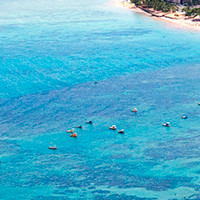

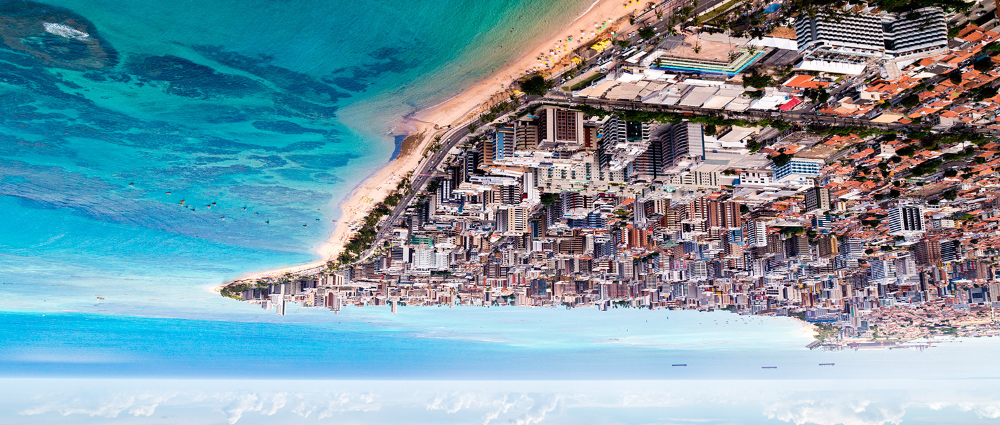

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow
from PIL import Image
import numpy as np
import cv2

drive.mount('/content/drive')
#(1)Crop and flip an image using Numpy array indexing.
img_np = np.array(Image.open('/content/drive/MyDrive/images/maceio.jpg'))
#(rows_pixels, columns_pixels, color_channels) 
print(img_np.shape)
img_crop = img_np[200:400, 200:400]
Image.fromarray(img_crop).save('/content/drive/MyDrive/images/maceio_crop.jpg')
Image.fromarray(np.flipud(img_np)).save('/content/drive/MyDrive/images/maceio_flipud.jpg')

img_crop = cv2.cvtColor(img_crop, cv2.COLOR_BGR2RGB)
img_flipud = cv2.cvtColor(np.flipud(img_np), cv2.COLOR_BGR2RGB)
cv2_imshow(img_crop)
cv2_imshow(img_flipud)


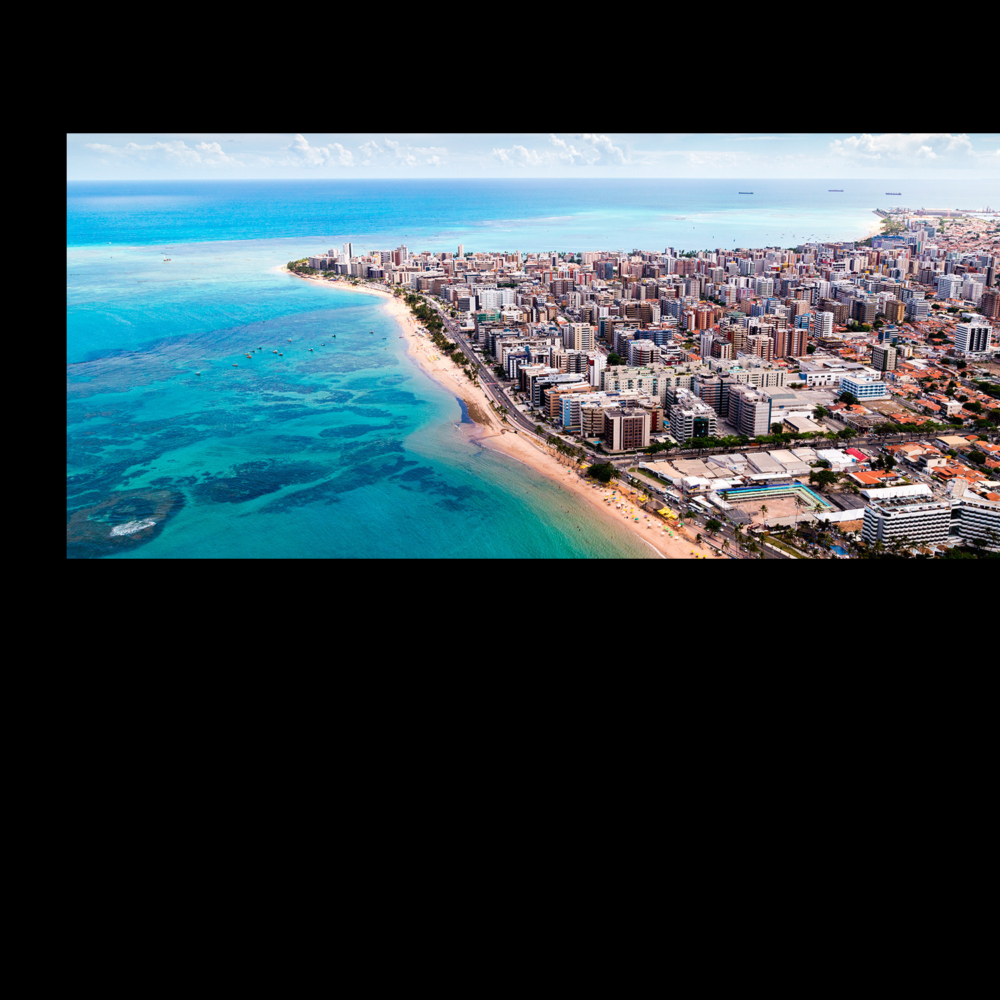

In [ ]:
#(2)Implement image translation using Numpy and OpenCV.

img_cv = cv2.imread('/content/drive/MyDrive/images/maceio.jpg')

width = img_cv.shape[1]
height = img_cv.shape[1]
# |1 0 tx| tx = horizontal
# |0 1 ty| ty = vertical
matrix = np.float32([[1, 0, 100], [0, 1, 200]])
img_translation = cv2.warpAffine(img_cv, matrix, (width, height))

cv2.imwrite('/content/drive/MyDrive/images/maceio_cv_transl.jpg', img_translation)
cv2_imshow(img_translation)

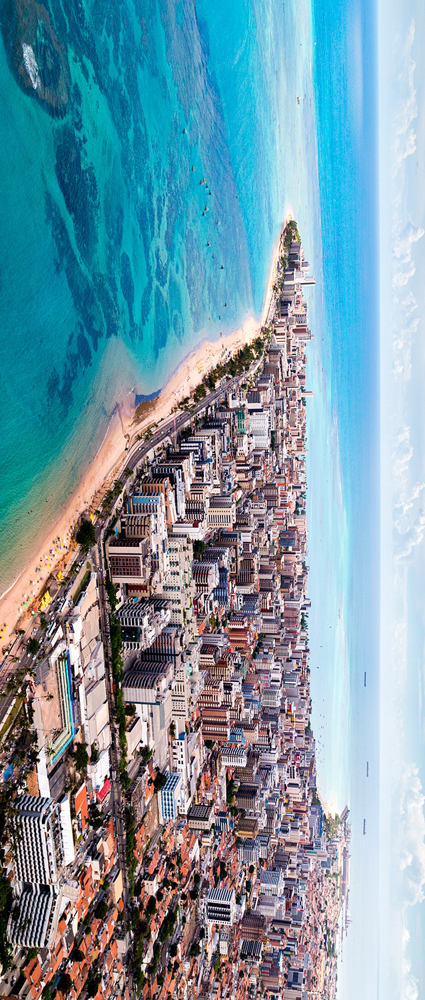

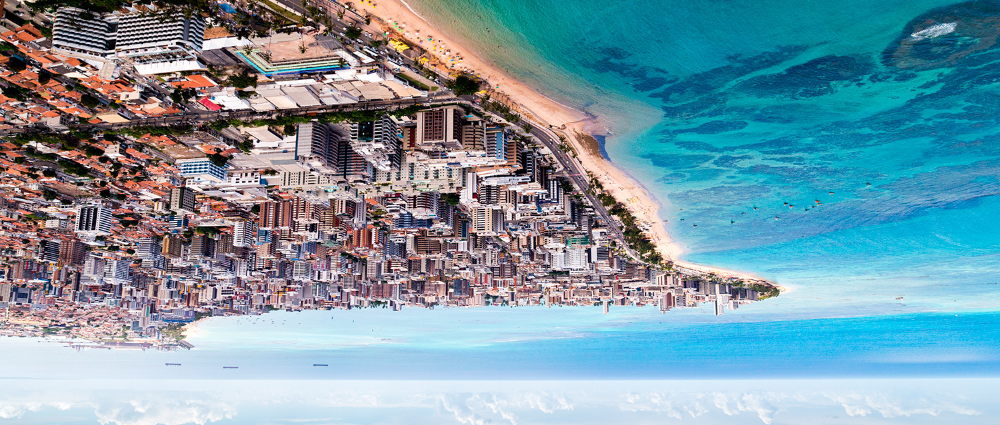

In [ ]:
#(3)Implement image rotation using Numpy and OpenCV.
#OpenCv
img_cv_rotate = cv2.rotate(img_cv, cv2.ROTATE_90_CLOCKWISE)
cv2.imwrite('/content/drive/MyDrive/images/maceio_cv_rotate.jpg', img_cv_rotate)

cv2_imshow(img_cv_rotate)

#Numpy
#rotate 180 degrees
Image.fromarray(np.rot90(img_np, 2)).save('/content/drive/MyDrive/images/maceio_numpy_rotate.jpg')
img_180 = cv2.cvtColor(np.rot90(img_np, 2), cv2.COLOR_BGR2RGB)
cv2_imshow(img_180)

(300, 300, 3)


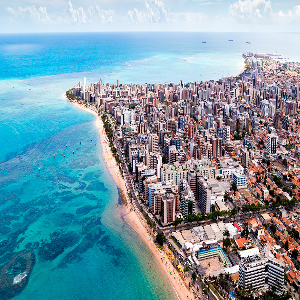

In [ ]:
#(4)Implement image resizing using OpenCV.

resiz_width = int(width * 0.2)
resiz_height = int(height * 0.2)

dsize = (resiz_width, resiz_height)
img_resized = cv2.resize(img_cv, dsize)
print(img_resized.shape)

cv2.imwrite('/content/drive/MyDrive/images/maceio_cv_resized.jpg', img_resized)
cv2_imshow(img_resized)

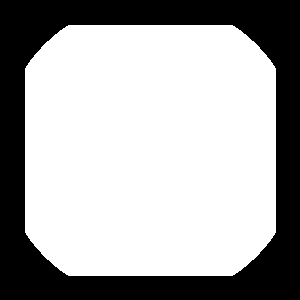

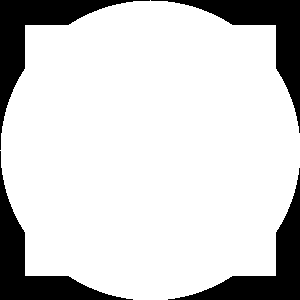

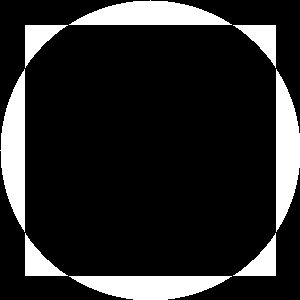

In [ ]:
#(5)Implement bitwise operations: AND, OR, XOR.

# draw a rectangle
rectangle = np.zeros((300, 300), dtype="uint8")
cv2.rectangle(rectangle, (25, 25), (275, 275), 255, -1)

# draw a circle
circle = np.zeros((300, 300), dtype = "uint8")
cv2.circle(circle, (150, 150), 150, 255, -1)

bitw_and = cv2.bitwise_and(rectangle, circle)
bitw_or = cv2.bitwise_or(rectangle, circle)
bitw_xor = cv2.bitwise_xor(rectangle, circle)

cv2.imwrite('/content/drive/MyDrive/images/and.jpg', bitw_and)
cv2.imwrite('/content/drive/MyDrive/images/or.jpg', bitw_or)
cv2.imwrite('/content/drive/MyDrive/images/xor.jpg', bitw_xor)

cv2_imshow(bitw_and)
cv2_imshow(bitw_or)
cv2_imshow(bitw_xor)


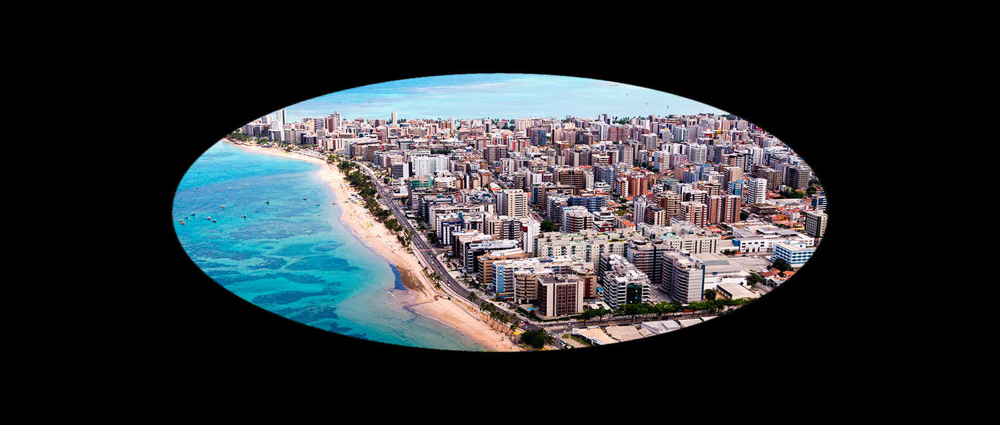

In [ ]:
#(6) Implement the "mask" operation, where a third image 'h' 
#contains only a Region of Interest (ROI -- defined by the second image mask 'g') 
#obtained from the input image 'f'. Note that this Region can be of any shape.

img_f = cv2.imread('/content/drive/MyDrive/images/maceio.jpg')
img_g = cv2.imread('/content/drive/MyDrive/images/circle.jpg')


img_g = cv2.resize(img_g, img_f.shape[1::-1])


img_h = cv2.bitwise_and(img_f, img_g)
cv2.imwrite('/content/drive/MyDrive/images/img_h.jpg', img_h)
cv2_imshow(img_h)